# **STIB-MIVB Vehicle Positions: Exploratory Data Analysis (EDA) - Punctuality and GTFS**

In [1]:
import folium as fl
import numpy as np
import pandas as pd
import geopandas as gpd
import warnings
import psycopg2
import psycopg2.extras as extras
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display, HTML, clear_output
from psycopg2 import Error
from psycopg2.extensions import ISOLATION_LEVEL_AUTOCOMMIT
from folium.plugins import HeatMap

plt.style.use("fivethirtyeight")
plt.rcParams.update({'font.size': 9})
warnings.simplefilter(action= 'ignore', category = UserWarning)

In [2]:
# load lines & stops from shapefile, as GeoDataFrame (gdf)

stib_lines = gpd.read_file("stib_data/network/ACTU_LINES.shp")
stib_stops = gpd.read_file("stib_data/network/ACTU_STOPS.shp")

In [3]:
# clean lines gdf

stib_lines = stib_lines.rename(
    str.lower, 
    axis = 'columns'
).rename(
    columns = {
        'ligne': 'line_code', 
        'variante': 'direction'
    }
)

In [4]:
# clean stops gdf

stib_stops = stib_stops.rename(
    str.lower, 
    axis = 'columns'
).drop(
    columns = ['descr_nl', 'alpha_fr', 'alpha_nl'], 
    axis = 1
).rename(
    columns = {
        'code_ligne': 'line_code', 
        'variante': 'direction',
        'succession': 'stop_seq',
        'descr_fr': 'stop_name',
        'mode': 'vehicle',
        'numero_lig': 'line',
        'terminus': 'end_stop'
    }
)

# map vehicle names for better readability

for index, row in stib_stops.iterrows():
    if row['vehicle'] == 'B':
        stib_stops.at[index,'vehicle'] ='BUS'
    elif row['vehicle'] == 'T':
        stib_stops.at[index,'vehicle'] = 'TRAM'
    elif row['vehicle'] == 'M':
        stib_stops.at[index,'vehicle'] = 'METRO'
    else:
        pass

In [5]:
# get distinct stops & lines

distinct_stop_lines = stib_stops[['line_code', 'vehicle', 'line']].drop_duplicates()
distinct_lines = stib_lines[['line_code', 'color_hex']].drop_duplicates()

In [6]:
# get additional attributes for lines gdf

stib_lines = stib_lines.merge(
    distinct_stop_lines, 
    on = 'line_code', how = 'inner'
)[[
    'vehicle', 
    'line', 
    'direction', 
    'date_debut', 
    'date_fin', 
    'color_hex', 
    'geometry'
]]

# get additional attributes for stops gdf

stib_stops = stib_stops.merge(
    distinct_lines, 
    on = 'line_code', how = 'inner'
)[[
    'vehicle', 
    'line', 
    'direction', 
    'stop_seq', 
    'stop_id', 
    'stop_name',
    'color_hex',
    'end_stop',
    'geometry'
]]

In [7]:
stib_lines.head(3)

,vehicle,line,direction,date_debut,date_fin,color_hex,geometry
0,METRO,1,1,01/09/2021,06/03/2022,#C4008F,"LINESTRING Z (146633.500 170956.400 0.000, 146..."
1,METRO,1,2,01/09/2021,06/03/2022,#C4008F,"LINESTRING Z (156746.700 170167.000 0.000, 156..."
2,METRO,2,1,01/09/2021,06/03/2022,#F57000,"LINESTRING Z (147305.500 172526.900 0.000, 147..."


In [8]:
# get lat & lon in a format usable for folium circle marker for stops

stib_stops = stib_stops.to_crs(4326)
stib_stops['lat'] = stib_stops.centroid.y
stib_stops['lon'] = stib_stops.centroid.x

stib_stops.head(3)

,vehicle,line,direction,stop_seq,stop_id,stop_name,color_hex,end_stop,geometry,lat,lon
0,BUS,12,1,1,9600B,BRUSSELS AIRPORT,#338C26,BRUSSELS CITY,POINT (4.48176 50.89815),50.898149,4.481761
1,BUS,12,1,2,3017,BOURGET,#338C26,BRUSSELS CITY,POINT (4.43033 50.87815),50.878151,4.430334
2,BUS,12,1,3,5048,DA VINCI,#338C26,BRUSSELS CITY,POINT (4.41044 50.87615),50.876146,4.410440


## 1. Connect DB

In [9]:
# set up connection variables
db_host = "localhost"
db_port = "5432"
db_user = "postgres"
db_pass = "hope"
db_name = "stib_transport"

# function to connect with postgres
def connect_postgres(db_host, db_port, db_user, db_pass, db_name):
    try:
        # connect to an existing database
        connection = psycopg2.connect(host = db_host,
                                      port = db_port,
                                      user = db_user,
                                      password = db_pass,
                                      database = db_name)
        # set auto-commit
        connection.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT);
        # create a cursor to perform database operations
        cur = connection.cursor()
        # print PostgreSQL details
        print("PostgreSQL server information")
        print(connection.get_dsn_parameters(), "\n")
        # execute a SQL query
        cur.execute("SELECT version();")
        # fetch result
        record = cur.fetchone()
        print("You are connected to - ", record, "\n")

    except (Exception, Error) as error:
        print("Error while connecting to PostgreSQL", error)
    else:
        return cur

In [10]:
# connect to postgres

cur = connect_postgres(db_host, db_port, db_user, db_pass, db_name)

PostgreSQL server information
{'user': 'postgres', 'channel_binding': 'prefer', 'dbname': 'stib_transport', 'host': 'localhost', 'port': '5432', 'options': '', 'sslmode': 'prefer', 'sslcompression': '0', 'sslsni': '1', 'ssl_min_protocol_version': 'TLSv1.2', 'gssencmode': 'prefer', 'krbsrvname': 'postgres', 'target_session_attrs': 'any'} 

You are connected to -  ('PostgreSQL 14.6 (Homebrew) on aarch64-apple-darwin22.1.0, compiled by Apple clang version 14.0.0 (clang-1400.0.29.202), 64-bit',) 



## 1. Understanding GTFS in contenxt of Punctuality 

### Q1: How much of the GTFS time table is punctuality vs regularity 

In [11]:
# query 

cur.execute(
    f"""
    
    select * from gtfs_w_qos
        
    """
)

df = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [12]:
df['qos'].value_counts(normalize=True) * 100


Regularity     63.481121
Punctuality    36.518879
Name: qos, dtype: float64

In [13]:
gtfs_qos_df = (
    df.groupby(["qos"])
    .size()
    .reset_index(name="Counts")
    .sort_values(by=["qos"])
)

In [14]:
gtfs_qos_df

,qos,Counts
0,Punctuality,2317010
1,Regularity,4027681


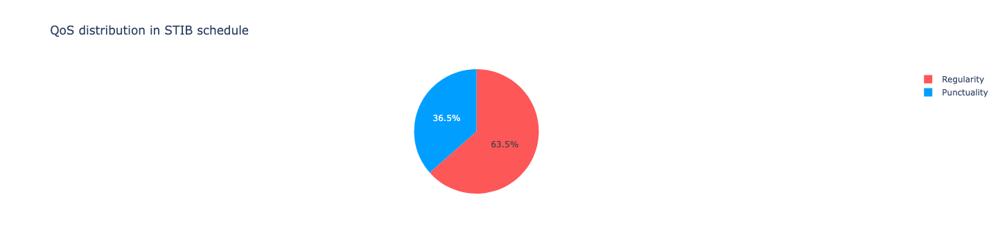

In [61]:
## Creating a pie chart

labels = gtfs_qos_df["qos"].unique()

values = gtfs_qos_df["Counts"]

stib_colors = [
    "#009eff",
    "#fe5757",
]

fig = go.Figure(
    data=[
        go.Pie(
            labels=labels,
            values=values,
            # iterate through earth_colors list to color individual pie pieces
            marker_colors=stib_colors,
        )
    ]
)
# Update layout to show a title
fig.update_layout(title_text="QoS distribution in STIB schedule")
# display the figure
fig.show()

### Q2: How is QoS distributed between the three vehicle types 

In [16]:
gtfs_qos_vh_q = (
    df.groupby(["vehicle","qos"])
    .size()
    .reset_index(name="Counts")
    .sort_values(by=["vehicle"])
)

In [17]:
gtfs_qos_vh_q

,vehicle,qos,Counts
0,BUS,Punctuality,1823818
1,BUS,Regularity,2172675
2,METRO,Punctuality,16468
3,METRO,Regularity,477091
4,TRAM,Punctuality,476724
5,TRAM,Regularity,1377915


In [18]:
tgtfs_qos_vh_q=gtfs_qos_vh_q.transpose()

In [19]:
ptgtfs_qos_vh_q = gtfs_qos_vh_q.pivot(index="vehicle", columns="qos", values="Counts")

In [20]:
ptgtfs_qos_vh_q['Total'] = ptgtfs_qos_vh_q['Punctuality'] + ptgtfs_qos_vh_q['Regularity']

In [21]:
ptgtfs_qos_vh_q

qos,Punctuality,Regularity,Total
vehicle,,,
BUS,1823818,2172675,3996493
METRO,16468,477091,493559
TRAM,476724,1377915,1854639


In [22]:
tptgtfs_qos_vh_q = ptgtfs_qos_vh_q.transpose()

In [23]:
tptgtfs_qos_vh_q

vehicle,BUS,METRO,TRAM
qos,,,
Punctuality,1823818,16468,476724
Regularity,2172675,477091,1377915
Total,3996493,493559,1854639


In [24]:
tptgtfs_qos_vh_q['BUS']

qos
Punctuality    1823818
Regularity     2172675
Total          3996493
Name: BUS, dtype: int64

In [25]:
tptgtfs_qos_vh_q['BUS']['Punctuality']

1823818

In [26]:
tptgtfs_qos_vh_q2 = tptgtfs_qos_vh_q.reset_index()

In [27]:
tptgtfs_qos_vh_q2

vehicle,qos,BUS,METRO,TRAM
0,Punctuality,1823818,16468,476724
1,Regularity,2172675,477091,1377915
2,Total,3996493,493559,1854639


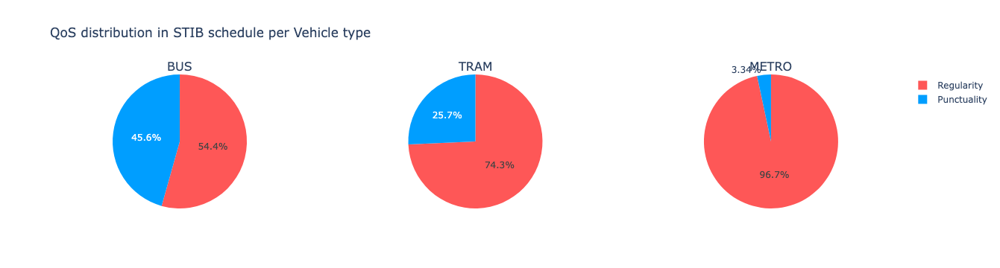

In [81]:
from plotly.subplots import make_subplots
import plotly 
plotly.offline.init_notebook_mode(connected=True)
import plotly.io as pio
pio.renderers.default = "plotly_mimetype+notebook"

blabels = tptgtfs_qos_vh_q2["qos"].unique()

bvalues = tptgtfs_qos_vh_q2["BUS"][:-1]

stib_colors = [
    "#009eff",
    "#fe5757",
]

fig_bus = go.Pie(
            labels=blabels,
            values=bvalues,
            # iterate through earth_colors list to color individual pie pieces
            marker_colors=stib_colors,
        )
#fig_bus.update_layout(title_text="BUS: QoS distribution in STIB schedule")

tlabels = tptgtfs_qos_vh_q2["qos"].unique()

tvalues = tptgtfs_qos_vh_q2["TRAM"][:-1]

fig_tram = go.Pie(
            labels=tlabels,
            values=tvalues,
            # iterate through earth_colors list to color individual pie pieces
            marker_colors=stib_colors,
        )
# Update layout to show a title
#fig_tram.update_layout(title_text="TRAM: QoS distribution in STIB schedule")

mlabels = tptgtfs_qos_vh_q2["qos"].unique()

mvalues = tptgtfs_qos_vh_q2["METRO"][:-1]

fig_metro =go.Pie(
            labels=mlabels,
            values=mvalues,
            # iterate through earth_colors list to color individual pie pieces
            marker_colors=stib_colors,
        )
# Update layout to show a title
#fig_metro.update_layout(title_text="METRO: QoS distribution in STIB schedule")
# display the combined figures
fig = make_subplots(rows=1, cols=3, specs=[[{"type": "pie"}, {"type": "pie"},{"type": "pie"}]], subplot_titles=('BUS','TRAM','METRO'))
fig.add_trace(fig_bus, 1, 1);
fig.add_trace(fig_tram, 1, 2);
fig.add_trace(fig_metro, 1, 3);
fig.update_layout(title_text="QoS distribution in STIB schedule per Vehicle type")

fig.show()

### Q3: How is QoS distributed between the three day categories

In [29]:
gtfs_qos_dc = (
    df.groupby(["day_category","qos"])
    .size()
    .reset_index(name="Counts")
    .sort_values(by=["day_category"])
)
gtfs_qos_dc

,day_category,qos,Counts
0,Saturday,Punctuality,553873
1,Saturday,Regularity,318140
2,Sunday,Punctuality,437386
3,Sunday,Regularity,50697
4,Weekday,Punctuality,1325751
5,Weekday,Regularity,3658844


In [30]:
pgtfs_qos_dc = gtfs_qos_dc.pivot(index="day_category", columns="qos", values="Counts")
pgtfs_qos_dc['Total'] = pgtfs_qos_dc['Punctuality'] + pgtfs_qos_dc['Regularity']
tpgtfs_qos_dc = pgtfs_qos_dc.transpose()
tpgtfs_qos_dc

day_category,Saturday,Sunday,Weekday
qos,,,
Punctuality,553873,437386,1325751
Regularity,318140,50697,3658844
Total,872013,488083,4984595


In [31]:
tpgtfs_qos_dc = tpgtfs_qos_dc.reset_index()

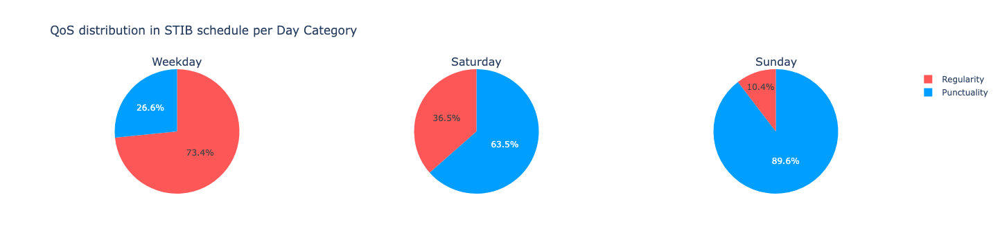

In [63]:
from plotly.subplots import make_subplots

labels = tpgtfs_qos_dc["qos"].unique()

wvalues = tpgtfs_qos_dc["Weekday"][:-1]

stib_colors = [
    "#009eff",
    "#fe5757",
]

fig_weekday= go.Pie(
            labels=labels,
            values=wvalues,
            marker_colors=stib_colors,
        )
stvalues = tpgtfs_qos_dc["Saturday"][:-1]

fig_saturday = go.Pie(
            labels=labels,
            values=stvalues,
            marker_colors=stib_colors,
        )
# Update layout to show a title
svalues = tpgtfs_qos_dc["Sunday"][:-1]

fig_sunday =go.Pie(
            labels=labels,
            values=svalues,
            # iterate through earth_colors list to color individual pie pieces
            marker_colors=stib_colors,
        )
# Update layout to show a title
#fig_metro.update_layout(title_text="METRO: QoS distribution in STIB schedule")
# display the combined figures
fig = make_subplots(rows=1, cols=3, specs=[[{"type": "pie"}, {"type": "pie"},{"type": "pie"}]], subplot_titles=('Weekday','Saturday','Sunday'))
fig.add_trace(fig_weekday, 1, 1);
fig.add_trace(fig_saturday, 1, 2);
fig.add_trace(fig_sunday, 1, 3);
fig.update_layout(title_text="QoS distribution in STIB schedule per Day Category")

fig.show()

### Q3: How is QoS distributed over the day

#### 4 segements: Midnight/Morning 00:00:00 -> 06:59:59 , Morning/Noon 07:00:00 -> 11:59:59 , Noon/Afternoon 12:00:00 -> 16:59:59 , Evening 17:00:00 -> 23:59:59

In [49]:
# query 

cur.execute(
    f"""
    
        with base as (
        select * from gtfs_w_qos
        )
    , segement_gtfs as (
        select 
        *
        , case 
            when arrival_time_norm::time BETWEEN '00:00:00'::time 
            AND '06:59:59'::time
            then 'Midnight/Morning'
            when arrival_time_norm::time BETWEEN '07:00:00'::time 
            AND '11:59:59'::time
            then 'Morning/Noon'
            when arrival_time_norm::time BETWEEN '12:00:00'::time 
            AND '16:59:59'::time
            then 'Noon/Afternoon'
            when arrival_time_norm::time BETWEEN '17:00:00'::time 
            AND '23:59:59'::time
            then 'Evening'
        end day_segement
        from base
    )
    select day_segement,qos,count(*) from segement_gtfs
    group by 
    day_segement
    , qos

    """
)

day_segments_qos = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [50]:
pday_segments_qos = day_segments_qos.pivot(index="day_segement", columns="qos", values="count")
pday_segments_qos['total'] = pday_segments_qos['Punctuality'] + pday_segments_qos['Regularity']
tpday_segments_qos = pday_segments_qos.transpose()
tpday_segments_qos = tpday_segments_qos.reset_index()

In [51]:
tpday_segments_qos

day_segement,qos,Evening,Midnight/Morning,Morning/Noon,Noon/Afternoon
0,Punctuality,977453,347962,482687,508908
1,Regularity,1138932,133312,1366611,1388826
2,total,2116385,481274,1849298,1897734


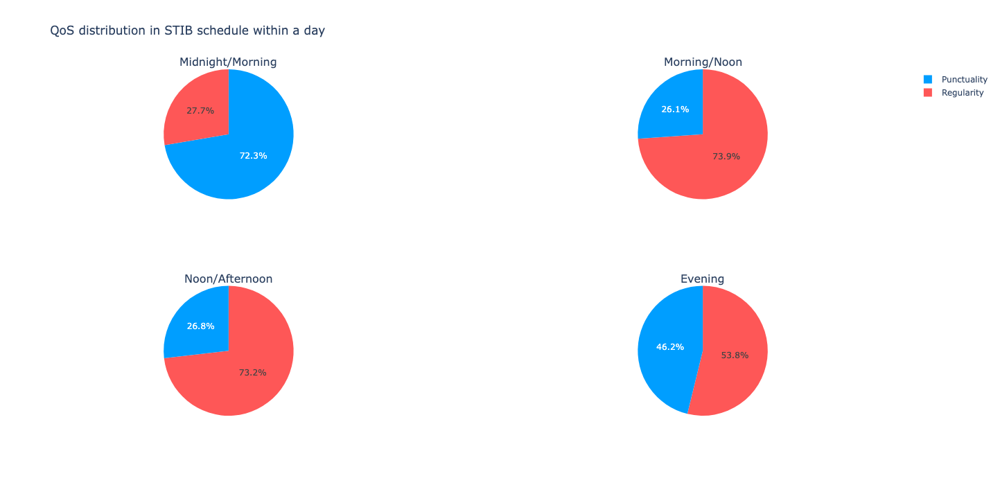

In [64]:
from plotly.subplots import make_subplots

labels = tpday_segments_qos["qos"].unique()

first_values = tpday_segments_qos["Midnight/Morning"][:-1]

stib_colors = [
    "#009eff",
    "#fe5757",
]

fig_1= go.Pie(
            labels=labels,
            values=first_values,
            marker_colors=stib_colors,
        )
second_values = tpday_segments_qos["Morning/Noon"][:-1]

fig_2 = go.Pie(
            labels=labels,
            values=second_values,
            marker_colors=stib_colors,
        )
# Update layout to show a title
third_values = tpday_segments_qos["Noon/Afternoon"][:-1]

fig_3 =go.Pie(
            labels=labels,
            values=third_values,
            # iterate through earth_colors list to color individual pie pieces
            marker_colors=stib_colors,
        )
fourth_values = tpday_segments_qos["Evening"][:-1]

fig_4 =go.Pie(
            labels=labels,
            values=fourth_values,
            # iterate through earth_colors list to color individual pie pieces
            marker_colors=stib_colors,
        )
# Update layout to show a title
# display the combined figures
fig = make_subplots(rows=2, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}],[{"type": "pie"}, {"type": "pie"}]], subplot_titles=('Midnight/Morning','Morning/Noon','Noon/Afternoon','Evening'))
fig.add_trace(fig_1, 1, 1);
fig.add_trace(fig_2, 1, 2);
fig.add_trace(fig_3, 2, 1);
fig.add_trace(fig_4, 2, 2);

fig.update_layout(title_text="QoS distribution in STIB schedule within a day")
fig.update_layout(
    autosize=False,
    width=700,
    height=700,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    )
)


fig.show()

### Q4: Actual arrival times (after cleaning/preprocessing) vs. Scheduled arrival times - for Punctuality 

#### here we try to check how many arrivals of a vehicle vs. the scheduled arrival times that exists in GTFS. This can give us a measure of how much data is missing in our analysis as we don't have the full continuous timetable in the VehiclePosition data. 

In [66]:
# query 

cur.execute(
    f"""
    with actual_count as (
        select 
        count(*) as actual_arrival_per_day
        , vh_date
        , vehicle
        , day_category
        , line
        , direction
        , stop_name
        from rt_punc
        group by 
        vh_date
        , vehicle
        , day_category
        , line
        , direction
        , stop_name
    )
    , sched_count as (
        select * from agg_gtfs_arrivals
        where qos = 'Punctuality'
    )
    , agg1 as (
        select
        ac.vh_date
        , ac.vehicle
        , ac.day_category
        , ac.line
        , ac.direction
        , ac.stop_name
        , ac.actual_arrival_per_day
        , sc.scheduled_arrivals_per_day
        , (sc.scheduled_arrivals_per_day - ac.actual_arrival_per_day) as diff
        from actual_count ac 
        join sched_count sc 
        on ac.vh_date = sc.date 
        and ac.day_category = sc.day_category
        and ac.line = sc.line 
        and ac.direction = sc.direction
        and ac.stop_name = sc.stop_name
        and ac.vehicle = sc.vehicle
    )
    select 
    sum(actual_arrival_per_day) as s_actual_arrival_per_day  
    , sum(scheduled_arrivals_per_day) as s_scheduled_arrivals_per_day
    --, sum(diff) as s_diff
    from agg1;
        
    """
)

sc_ac_p = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])
sc_ac_p.rename(columns = {'s_actual_arrival_per_day':'Actual Arrivals', 's_scheduled_arrivals_per_day':'Scheduled Arrivals in GTFS' }, inplace = True)

In [67]:
sc_ac_p.head()

,Actual Arrivals,Scheduled Arrivals in GTFS
0,469684,1499425


In [68]:
tp = sc_ac_p.transpose()

In [69]:
tp.rename(columns = {0:'count','s_actual_arrival_per_day':'Actual Arrivals', 's_scheduled_arrivals_per_day':'Scheduled Arrivals in GTFS' }, inplace = True)

In [70]:
tp = tp.reset_index()

In [71]:
tp

,index,count
0,Actual Arrivals,469684
1,Scheduled Arrivals in GTFS,1499425


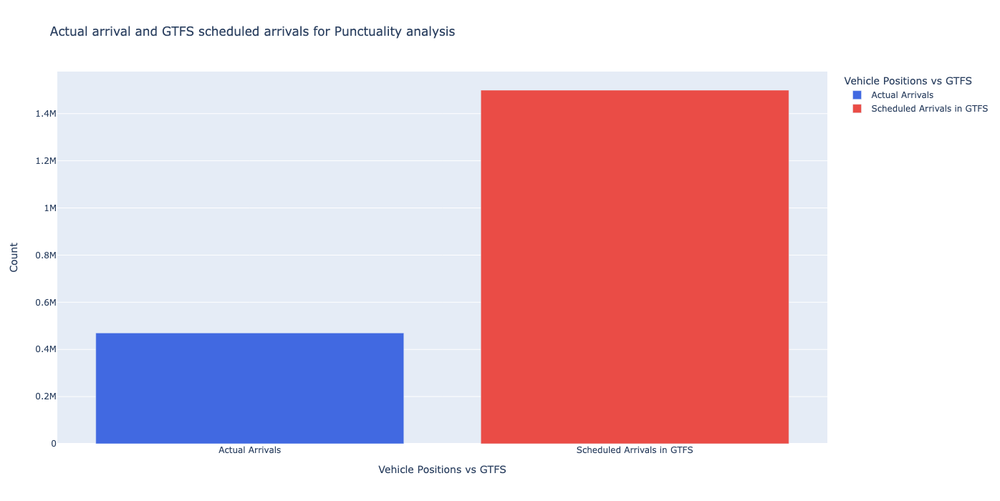

In [84]:
# visualize punctuality
stib_colors = [
    "#4169e1",
    "#ea4c46",
    "#ffc200",
]
fig = px.bar(
    tp, 
    x = 'index', 
    y = 'count',
    color = 'index',
    labels = {
        'index': 'Vehicle Positions vs GTFS',
        'count': 'Count'
    },
    title = 'Actual arrival and GTFS scheduled arrivals for Punctuality analysis',
    color_discrete_sequence=stib_colors 
)

fig.update_layout(
    autosize=False,
    width=700,
    height=700,

)

fig.show()

## 2. Having a quick overview over the QoS for Punctuality per Line 

In [74]:
# query 

cur.execute(
    f"""
            with agg1 as (
            select
              vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
            , round((percentile_cont(0.5) within group (order by diff))::numeric, 2) as median_diff
            --, avg(diff) as median_diff
            from punctuality_ewt
            where day_category = 'Weekday'
            and diff < 120 --out service
            group by
                  vehicle
                , line
                , direction
                , stop_name
                , stop_seq
                , sched_timegroup
                , timegroup_start_in
                , timegroup_end_ex
        )
    , agg2 as (
            select
              vehicle
            , line
            , direction
            , stop_name
            , round((percentile_cont(0.5) within group (order by median_diff))::numeric, 2) as median2_diff
            --, avg(median_diff) as median_diff2
            from agg1
            group by
                  vehicle
                , line
                , direction
                , stop_name
    )
    , agg3 as (
        select
              vehicle
            , line
            , direction
            , round((percentile_cont(0.5) within group (order by median2_diff))::numeric, 2) as median3_diff
            --, avg(median_diff2) as median3_diff
            from agg2
            group by
                  vehicle
                , line
                , direction

    )

    select * from agg3 
    where median3_diff is not null
        
    """
)

p_df = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [75]:
p_df.head()

,vehicle,line,direction,median3_diff
0,BUS,12,1,1.76
1,BUS,12,2,1.84
2,BUS,13,1,1.00
3,BUS,13,2,1.84
4,BUS,14,1,3.13


In [76]:
dir_1 = p_df.loc[p_df.direction == 1]
dir_2 = p_df.loc[p_df.direction == 2]

#### Note that line 71 shows a very high rate of not being delay :( on weekdays

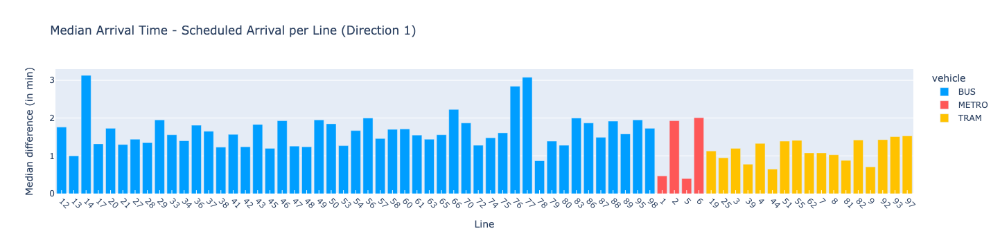

In [77]:
# visualize punctuality
stib_colors3 = [
    "#009eff",
    "#fe5757",
    "#ffc200",
]

fig = px.bar(
    dir_1.loc[dir_1.line!='71'], 
    x = 'line', 
    y = 'median3_diff',
    color = 'vehicle',
    labels = {
        'line': 'Line',
        'median3_diff': 'Median difference (in min)'
    },
    title = 'Median Arrival Time - Scheduled Arrival per Line (Direction 1)',
    color_discrete_sequence=stib_colors3 
)


fig.update_xaxes(ticks = "inside", tickcolor = 'white', tickangle = 45)

# fig.add_hline(y= 0.5, line_width = 3, line_dash = "dash", line_color = "black")
# fig.add_hline(y= 0.75, line_width = 3, line_dash = "dash", line_color = "orange")

fig.show()

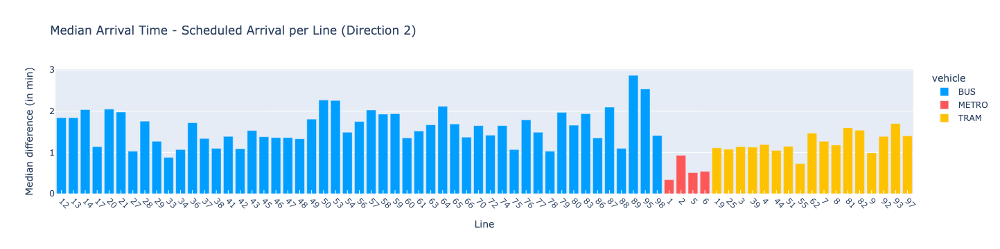

In [78]:
# visualize punctuality

fig = px.bar(
    dir_2.loc[dir_2.line!='71'], 
    x = 'line', 
    y = 'median3_diff',
    color = 'vehicle',
    labels = {
        'line': 'Line',
        'median3_diff': 'Median difference (in min)'
    },
    title = 'Median Arrival Time - Scheduled Arrival per Line (Direction 2)',
    color_discrete_sequence=stib_colors3 
)


fig.update_xaxes(ticks = "inside", tickcolor = 'white', tickangle = 45)

# fig.add_hline(y= 0.5, line_width = 3, line_dash = "dash", line_color = "black")
# fig.add_hline(y= 0.75, line_width = 3, line_dash = "dash", line_color = "orange")

fig.show()

### 3. Lets zoom in to the Lines

In [45]:
# query 

cur.execute(
    f"""
    
    with agg1 as (
            select
              vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
            --, round((percentile_cont(0.5) within group (order by diff))::numeric, 2) as median_diff
            , avg(diff) as avg_diff
            from punctuality_ewt
            where day_category = 'Weekday'
            and diff < 60
            group by
                  vehicle
                , line
                , direction
                , stop_name
                , stop_seq
                , sched_timegroup
                , timegroup_start_in
                , timegroup_end_ex
        )
    , agg2 as (
            select
              vehicle
            , line
            , direction
            , stop_name
            --, round((percentile_cont(0.5) within group (order by avg_diff))::numeric, 2) as median2_diff
            , avg(avg_diff) as avg2_diff
            from agg1
            group by
                  vehicle
                , line
                , direction
                , stop_name
    )
    , agg3 as (
        select
              vehicle
            , stop_name
            --, round((percentile_cont(0.5) within group (order by avg2_diff))::numeric, 2) as avg3_diff
            , avg(avg2_diff) as avg3_diff
            from agg2
            group by
                  vehicle
                , stop_name

    )

    select * from agg3 
    where avg3_diff is not null
    order by avg3_diff desc;
        
    """
)

stops_punc_ewt = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [46]:
# quick view of first few lines from query output

stops_punc_ewt.head()

,vehicle,stop_name,avg3_diff
0,BUS,MUSEE D'IXELLES,14.08750000000000000000
1,BUS,QUART.ST-BONIFACE,13.56180431547619047084
2,BUS,BUYL,13.1887500000000000
3,BUS,ETANGS D'IXELLES,12.9083333333333333
4,BUS,CIM. D'IXELLES,10.70841666666666665556


In [47]:
stops = stib_stops.merge(
    stops_punc_ewt,
    how = 'inner',
    left_on = ['vehicle', 'stop_name'],
    right_on = ['vehicle', 'stop_name']
).rename(
    columns = {
        'avg3_diff': 'avg_ewt_punc'
    }
)

stops.avg_ewt_punc = stops.avg_ewt_punc.astype('float64')

stops.head(3)

,vehicle,line,direction,stop_seq,stop_id,stop_name,color_hex,end_stop,geometry,lat,lon,avg_ewt_punc
0,BUS,12,1,1,9600B,BRUSSELS AIRPORT,#338C26,BRUSSELS CITY,POINT (4.48176 50.89815),50.898149,4.481761,5.412709
1,BUS,12,2,9,9600B,BRUSSELS AIRPORT,#338C26,BRUSSELS AIRPORT,POINT (4.48176 50.89815),50.898149,4.481761,5.412709
2,BUS,12,1,2,3017,BOURGET,#338C26,BRUSSELS CITY,POINT (4.43033 50.87815),50.878151,4.430334,1.909014


In [48]:
bus_lines = stib_lines.loc[stib_lines.vehicle == 'BUS']
tram_lines = stib_lines.loc[stib_lines.vehicle == 'TRAM']
metro_lines = stib_lines.loc[stib_lines.vehicle == 'METRO']

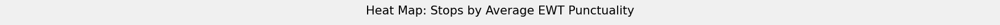

In [49]:
# plot interactive map

fig, ax = plt.subplots(1, 1, figsize = (20, 0.01))
ax.set_title('Heat Map: Stops by Average EWT Punctuality', size = 15)
ax.axis("off")
plt.show()

map_median_ewt_punctuality_qos = fl.Map(
    location = [50.8476, 4.3572],
    tiles = 'CartoDB positron',
    zoom_start = 13,
    control_scale = True
)

HeatMap(
    stops[['lat', 'lon', 'avg_ewt_punc']], 
    min_opacity = 0.2,
    blur = 18,
    overlay = True
).add_to(
    fl.FeatureGroup(
        name = 'Heat Map'
    ).add_to(
        map_median_ewt_punctuality_qos
    )
)

vehicle_colours = {'BUS': 'blue', 'TRAM': 'green', 'METRO': 'orange'}

for grp_name, df_grp in stib_lines.groupby('vehicle'):
    
    feature_group_stops = fl.FeatureGroup(grp_name + ' Stops', show = False)
        
    for index, data in stops.loc[(stops.vehicle == grp_name)].iterrows():
        fl.Circle(
            location = [data.lat, data.lon], 
            tooltip = data[['vehicle', 'line', 'direction', 'stop_seq', 'stop_name', 'end_stop']].to_dict(), 
            radius = 25, 
            color = vehicle_colours.get(grp_name), 
            fill = True
        ).add_to(feature_group_stops)
    
    feature_group_stops.add_to(map_median_ewt_punctuality_qos)
    
bus_lines_fg = fl.FeatureGroup(name = 'BUS Lines', show = False)
tram_lines_fg = fl.FeatureGroup(name = 'TRAM Lines', show = False)
metro_lines_fg = fl.FeatureGroup(name = 'METRO Lines', show = False)

fl.Choropleth(
    geo_data = bus_lines,
    line_color = 'blue',
    highlight = True
).add_to(bus_lines_fg)

fl.Choropleth(
    geo_data = tram_lines,
    line_color = 'green',
    highlight = True
).add_to(tram_lines_fg)

fl.Choropleth(
    geo_data = metro_lines,
    line_color = 'orange',
    highlight = True
).add_to(metro_lines_fg)

bus_lines_fg.add_to(map_median_ewt_punctuality_qos)
tram_lines_fg.add_to(map_median_ewt_punctuality_qos)
metro_lines_fg.add_to(map_median_ewt_punctuality_qos)

    
fl.LayerControl(collapsed = False).add_to(map_median_ewt_punctuality_qos)
map_median_ewt_punctuality_qos

In [50]:
# query 

cur.execute(
    f"""
    
        with base as (
            select
                  vehicle
                , line
                , direction
                , stop_name
                , stop_seq
                , sched_timegroup
                , timegroup_start_in
                , timegroup_end_ex
                --, round((percentile_cont(0.5) within group (order by diff))::numeric, 2) as median_diff
                , avg(diff) as avg_diff
                from punctuality_ewt
                where day_category = 'Weekday'
                and diff < 60
                group by
                      vehicle
                    , line
                    , direction
                    , stop_name
                    , stop_seq
                    , sched_timegroup
                    , timegroup_start_in
                    , timegroup_end_ex
        )

        , time_buckets as (
            select
            *,
            generate_series(
                ('2021-09-06 ' || timegroup_start_in)::timestamp, 
                ('2021-09-06 ' || timegroup_end_ex)::timestamp, 
                '15 minutes'::interval
            ) as time_buckets
            from base
            where timegroup_end_ex > timegroup_start_in
            union all
            select
            *,
            generate_series(
                ('2021-09-06 ' || timegroup_start_in)::timestamp, 
                ('2021-09-07 ' || timegroup_end_ex)::timestamp, 
                '15 minutes'::interval
            ) as time_buckets
            from base
            where timegroup_end_ex < timegroup_start_in
        )

        , agg2 as (
            select
              vehicle
            , line
            , direction
            , time_buckets::time as time_buckets
            --, round((percentile_cont(0.5) within group (order by median_diff))::numeric, 2) as median2_diff
            , avg(avg_diff) as avg2_diff
            from time_buckets
            group by
                  vehicle
                , line
                , direction
                , time_buckets::time
            EXCEPT 
            select
              vehicle
            , line
            , direction
            , time_buckets::time as time_buckets
            --, round((percentile_cont(0.5) within group (order by median_diff))::numeric, 2) as median2_diff
            , avg(avg_diff) as avg2_diff
            from time_buckets
            where time_buckets::time >= '02:15:00'::time and time_buckets::time <= '04:45:00'::time
            and vehicle = 'TRAM'
            group by
                  vehicle
                , line
                , direction
                , time_buckets::time
        )

        , agg3 as (
            select
              vehicle
            , time_buckets
            --, round((percentile_cont(0.5) within group (order by median2_diff))::numeric, 2) as median_ewt
            , avg(avg2_diff) as avg_ewt
            from agg2
            group by
                  vehicle
                , time_buckets
        )

        select 
        vehicle,
        time_buckets,
        avg_ewt
        from agg3
        order by 
        -- vehicle, 
        case
            when (extract(hour from time_buckets) + (extract(minute from time_buckets)/60)) >= 5 then (extract(hour from time_buckets) + (extract(minute from time_buckets)/60))
            else (extract(hour from time_buckets) + (extract(minute from time_buckets)/60)) + 24
        end
        -- do a special sort to ensure that the output sorts from 5am as the start, to align with the way that stib schedules start on a daily basis

    """
)

time_bucket_avg_ewt = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [51]:
time_bucket_avg_ewt

,vehicle,time_buckets,avg_ewt
0,TRAM,05:00:00,2.18381018346242602768
1,BUS,05:00:00,1.45760535392133571458
2,BUS,05:15:00,1.68927653929790331034
3,TRAM,05:15:00,1.50369380567570432952
4,METRO,05:15:00,4.04466666666666666667
...,...,...,...
190,BUS,02:15:00,27.00714126758658008750
191,BUS,02:30:00,38.8546969696969697
192,BUS,02:45:00,38.8546969696969697
193,BUS,03:00:00,38.8546969696969697


In [52]:
# visualize headways

fig = px.line(
    time_bucket_median_ewt, 
    x = 'time_buckets', 
    y = 'avg_ewt',
    color = 'vehicle',
    markers = True,
    labels = {
        'time_buckets': 'Time Buckets (15 minutes)',
        'avg_ewt': 'Average EWT - Punctuality'
    },
    title = '<span style = "font-size: 20px; font-weight: bold">Vehicle: Average EWT (on a Weekday)</span>',
    color_discrete_sequence=stib_colors3 
)

fig.add_hrect(y0 = 10, y1 = 20, line_width = 0, fillcolor = "orange", opacity = 0.2)
fig.add_hrect(y0 = 20, y1 = 40, line_width = 0, fillcolor = "red", opacity = 0.2)
fig.update_xaxes(categoryorder = 'array', categoryarray = time_bucket_median_ewt.time_buckets.drop_duplicates().tolist())
fig.update_xaxes(ticks = "inside", tickcolor = 'white', tickangle = 45, nticks = 24)
fig.update_layout(
    height = 500
)

fig.show()

NameError: name 'time_bucket_median_ewt' is not defined

In [ ]:
# query 

cur.execute(
    f"""
    
    with base as (
            select
                  vehicle
                , day_category
                , line
                , direction
                , stop_name
                , stop_seq
                , sched_timegroup
                , timegroup_start_in
                , timegroup_end_ex
                --, round((percentile_cont(0.5) within group (order by diff))::numeric, 2) as median_diff
                , avg(diff) as avg_diff
                from punctuality_ewt
                where diff < 60
                group by
                      vehicle
                    , day_category
                    , line
                    , direction
                    , stop_name
                    , stop_seq
                    , sched_timegroup
                    , timegroup_start_in
                    , timegroup_end_ex
        )
     , time_buckets as (
            select
            *,
            generate_series(
                ('2021-09-06 ' || timegroup_start_in)::timestamp, 
                ('2021-09-06 ' || timegroup_end_ex)::timestamp, 
                '15 minutes'::interval
            ) as time_buckets
            from base
            where timegroup_end_ex > timegroup_start_in
            union all
            select
            *,
            generate_series(
                ('2021-09-06 ' || timegroup_start_in)::timestamp, 
                ('2021-09-07 ' || timegroup_end_ex)::timestamp, 
                '15 minutes'::interval
            ) as time_buckets
            from base
            where timegroup_end_ex < timegroup_start_in
        )
        
         , agg2 as (
            select
                day_category
            , line
            , direction
            , time_buckets::time as time_buckets
            --, round((percentile_cont(0.5) within group (order by median_diff))::numeric, 2) as median2_diff
            , avg(avg_diff) as avg2_diff
            from time_buckets
            group by
                day_category
                , line
                , direction
                , time_buckets::time
            EXCEPT 
            select
              day_category
            , line
            , direction
            , time_buckets::time as time_buckets
            --, round((percentile_cont(0.5) within group (order by median_diff))::numeric, 2) as median2_diff
            , avg(avg_diff) as avg2_diff
            from time_buckets
            where time_buckets::time >= '02:15:00'::time and time_buckets::time <= '04:45:00'::time
            and vehicle = 'TRAM'
            group by
                  day_category
                , line
                , direction
                , time_buckets::time
        )
        
        , agg3 as (
            select
              day_category
            , time_buckets
            --, round((percentile_cont(0.5) within group (order by median2_diff))::numeric, 2) as median_ewt
            , avg(avg2_diff) as avg_ewt
            from agg2
            group by
                  day_category
                , time_buckets
        )

    select 
    day_category,
    time_buckets,
    avg_ewt
    from agg3
    order by 
    -- day_category, 
    case
        when (extract(hour from time_buckets) + (extract(minute from time_buckets)/60)) >= 5 then (extract(hour from time_buckets) + (extract(minute from time_buckets)/60))
        else (extract(hour from time_buckets) + (extract(minute from time_buckets)/60)) + 24
    end
    -- do a special sort to ensure that the output sorts from 5am as the start, to align with the way that stib schedules start on a daily basis
        
    """
)

day_cat_time_bucket_avg_ewt_p = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [ ]:
# visualize headways

fig = px.line(
    day_cat_time_bucket_avg_ewt_p, 
    x = 'time_buckets', 
    y = 'avg_ewt',
    color = 'day_category',
    markers = True,
    labels = {
        'time_buckets': 'Time Buckets (15 mins each)',
        'avg_ewt': 'Avg EWT'
    },
    title = '<span style = "font-size: 20px; font-weight: bold">Day Category: Avg EWT for Punctuality</span>',
    color_discrete_sequence=stib_colors3 
)

fig.add_hrect(y0 = 10, y1 = 20, line_width = 0, fillcolor = "orange", opacity = 0.2)
fig.add_hrect(y0 = 20, y1 = 40, line_width = 0, fillcolor = "red", opacity = 0.2)
fig.update_xaxes(categoryorder = 'array', categoryarray = day_cat_time_bucket_avg_ewt_p.time_buckets.drop_duplicates().tolist())
fig.update_xaxes(ticks = "inside", tickcolor = 'white', tickangle = 45, nticks = 24)
fig.update_layout(
    height = 500
)


fig.show()

In [282]:
# query 

cur.execute(
    f"""
    
    with base as (
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , sched_timegroup
        , timegroup_start_in
        , timegroup_end_ex
		, avg(diff) as avg_diff
	    from punctuality_ewt
        where day_category = 'Weekday'
		and diff < 60
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
    )
--select * from base; 
 , agg2 as ( --aggregate based on stops
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , avg(avg_diff)::numeric(9, 2) as avg2_diff
        from base
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
    )
--select max(avg2_diff) from agg2;
 , high_cases as (
        select
          day_category
        , vehicle
        , line
        , direction
        , min(stop_seq) as min_stop_seq
        , max(stop_seq) as max_stop_seq
        , avg(avg2_diff) as avg3_diff
        from agg2
        where avg2_diff >= 5
        group by
              day_category
            , vehicle
            , line
            , direction
    )
	
--select * from high_cases
, check_all as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.min_stop_seq
        , b.max_stop_seq
        , avg(avg3_diff)::numeric(9, 2) as avg3_diff
        from agg2 a
        inner join high_cases b
            on a.day_category = b.day_category
            and a.vehicle = b.vehicle
            and a.line = b.line
            and a.direction = b.direction
            and a.stop_seq >= b.min_stop_seq
            and a.stop_seq <= b.max_stop_seq
        where b.max_stop_seq - b.min_stop_seq >= 2
        group by
             a.day_category
            , a.vehicle
            , a.line
            , a.direction
            , b.min_stop_seq
            , b.max_stop_seq
        having avg(avg3_diff) >= 5
    )
--	select * from check_all
, distinct_lines_stops as (
        select
          distinct
          line
        , direction
        , stop_name
        , stop_seq
        from stop_details_combined
    )
, join_full_line as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.stop_seq
        , b.stop_name
        , case
            when b.stop_seq >= min_stop_seq and b.stop_seq <= max_stop_seq then '#800000'
            else '#0066ff' --stib_blue
          end as colour_hex 
        from check_all a
        inner join distinct_lines_stops b
            on a.line = b.line
            and a.direction = b.direction
    )
--select * from join_full_line;
    , intersecting_lines as (
        select
          a.*
        , b.line as int_line
        , b.direction as int_line_direction
        from join_full_line a
        inner join join_full_line b
            on a.vehicle = b.vehicle
            and a.stop_name = b.stop_name
            and a.line != b.line
    )
--select * from intersecting_lines;
    , int_stops_seq as (
        select 
          *
        , stop_seq - (lag(stop_seq, 2) over(partition by vehicle, line, direction, int_line, int_line_direction order by stop_seq)) prev_two_stop_seq_diff
        from intersecting_lines
        order by 
              line
            , direction
            , int_line
            , int_line_direction
            , stop_seq
    )
    , three_plus_int_stops as (
        select 
          distinct
          day_category
        , vehicle
        , line
    -- 	, direction
        , int_line
    -- 	, int_line_direction
        from int_stops_seq
        where prev_two_stop_seq_diff = 2
    )
    , int_lines_list as (
        select 
        vehicle,
        line,
        array_agg(int_line) over(partition by vehicle, line order by int_line) as int_lines_list,
        count(int_line) over(partition by vehicle, line order by int_line range between unbounded preceding and unbounded following) as int_lines_count 
        from three_plus_int_stops
    )

    , int_lines_list_full as (
        select
          vehicle
        , line
        , int_lines_count
        , max(int_lines_list) as int_lines_list
        from int_lines_list
        group by
             vehicle
            , line
            , int_lines_count	
        order by int_lines_count desc
    )
--	select * from int_lines_list_full;
, specific_case as (
        select
        *
        from int_lines_list_full
        where line = '13'
    )

    , lines as (
        select
        distinct
        a.*
        from
        join_full_line a
        inner join three_plus_int_stops b
            on a.line = b.line
            or a.line = b.int_line
        where b.line = '13'
    )

    select 
      a.day_category
    , a.vehicle
    , a.line
    , a.direction
    , stop_seq
    , stop_name
    , b.avg3_diff 
    , case
        when b.avg3_diff >= 2 and  b.avg3_diff < 4 then '#F6BDC0'
        when b.avg3_diff >= 4 and  b.avg3_diff < 6 then '#F07470'
        when b.avg3_diff >= 6 then '#DC1C13'
        else a.colour_hex
      end as colour_hex
    , case
        when b.avg3_diff is not null then ((b.avg3_diff-4.21)/(6.45-4.21))*50
        else 20
      end as marker_weight
    from lines a
    left join check_all b
        on a.line = b.line
        and a.direction = b.direction
        and a.stop_seq >= b.min_stop_seq
        and a.stop_seq <= b.max_stop_seq
    order by 
        line, 
        direction, 
        stop_seq
    ;
        
    """
)

line_subset_punc_ewt = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [283]:
line_subset_punc_ewt.head()

,day_category,vehicle,line,direction,stop_seq,stop_name,avg3_diff,colour_hex,marker_weight
0,Weekday,BUS,13,1,1,ETANGS NOIRS,6.45,#DC1C13,50.00000000000000000000
1,Weekday,BUS,13,1,2,AUTRIQUE,6.45,#DC1C13,50.00000000000000000000
2,Weekday,BUS,13,1,3,VANHUFFEL,6.45,#DC1C13,50.00000000000000000000
3,Weekday,BUS,13,1,4,SIMONIS,6.45,#DC1C13,50.00000000000000000000
4,Weekday,BUS,13,1,5,PARC ELISABETH,6.45,#DC1C13,50.00000000000000000000


In [284]:
line_subset_punc_ewt.line = line_subset_punc_ewt.line.astype('int64')

subset_stops = stib_stops.merge(
    line_subset_punc_ewt,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction', 'stop_seq', 'stop_name'],
    right_on = ['vehicle','line', 'direction', 'stop_seq', 'stop_name']
)

subset_lines = stib_lines.merge(
    line_subset_punc_ewt,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction'],
    right_on = ['vehicle','line', 'direction']
)[['vehicle', 'line', 'direction', 'date_debut', 'date_fin', 'color_hex', 'geometry']].drop_duplicates().reset_index(drop = True)

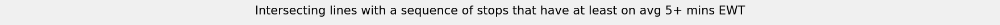

In [286]:
# plot interactive map

fig, ax = plt.subplots(1, 1, figsize = (20, 0.01))
ax.set_title('Intersecting lines with a sequence of stops that have at least on avg 5+ mins EWT', size = 15)
ax.axis("off")
plt.show()

map_line_subset_punc_ewt = fl.Map(
    location = [50.8476, 4.3572],
    tiles = 'CartoDB positron',
    zoom_start = 13,
    control_scale = True
)

for grp_name, df_grp in subset_lines.groupby('line'):
    
    feature_group = fl.FeatureGroup('Line ' + str(grp_name), show = True)
    
    for row in df_grp.itertuples():
        fl.Choropleth(
            geo_data = df_grp, 
            line_color = 'black',
            highlight = True
        ).add_to(feature_group)
        
    for index, data in subset_stops.loc[(subset_stops.line == grp_name)].iterrows():
        fl.Circle(
            location = [data.lat, data.lon], 
            tooltip = data[['vehicle', 'line', 'direction', 'stop_seq', 'stop_name', 'end_stop']].to_dict(), 
            radius = float(data.marker_weight), 
            color = data.colour_hex, 
            fill = True
        ).add_to(feature_group)
    
    feature_group.add_to(map_line_subset_punc_ewt)
    
fl.LayerControl(collapsed = False).add_to(map_line_subset_punc_ewt)
map_line_subset_punc_ewt

In [287]:
# query 

cur.execute(
    f"""
    
        with base as (
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , sched_timegroup
        , timegroup_start_in
        , timegroup_end_ex
		, avg(diff) as avg_diff
	    from punctuality_ewt
        where day_category = 'Weekday'
		and diff < 60
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
    )
--select * from base; 
 , agg2 as ( --aggregate based on stops
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , avg(avg_diff)::numeric(9, 2) as avg2_diff
        from base
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
    )
--select max(avg2_diff) from agg2;
 , high_cases as (
        select
          day_category
        , vehicle
        , line
        , direction
        , min(stop_seq) as min_stop_seq
        , max(stop_seq) as max_stop_seq
        , avg(avg2_diff) as avg3_diff
        from agg2
        where avg2_diff >= 4
        group by
              day_category
            , vehicle
            , line
            , direction
    )
	
--select * from high_cases
, check_all as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.min_stop_seq
        , b.max_stop_seq
        , avg(avg3_diff)::numeric(9, 2) as avg3_diff
        from agg2 a
        inner join high_cases b
            on a.day_category = b.day_category
            and a.vehicle = b.vehicle
            and a.line = b.line
            and a.direction = b.direction
            and a.stop_seq >= b.min_stop_seq
            and a.stop_seq <= b.max_stop_seq
        where b.max_stop_seq - b.min_stop_seq >= 2
        group by
             a.day_category
            , a.vehicle
            , a.line
            , a.direction
            , b.min_stop_seq
            , b.max_stop_seq
        having avg(avg3_diff) >= 4
    )
--	select * from check_all
, distinct_lines_stops as (
        select
          distinct
          line
        , direction
        , stop_name
        , stop_seq
        from stop_details_combined
    )
, join_full_line as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.stop_seq
        , b.stop_name
        , case
            when b.stop_seq >= min_stop_seq and b.stop_seq <= max_stop_seq then '#800000'
            else '#0066ff' --stib_blue 
          end as colour_hex 
        from check_all a
        inner join distinct_lines_stops b
            on a.line = b.line
            and a.direction = b.direction
    )
--select * from join_full_line;
    , intersecting_lines as (
        select
          a.*
        , b.line as int_line
        , b.direction as int_line_direction
        from join_full_line a
        inner join join_full_line b
            on a.vehicle = b.vehicle
            and a.stop_name = b.stop_name
            and a.line != b.line
    )
--select * from intersecting_lines;
    , int_stops_seq as (
        select 
          *
        , stop_seq - (lag(stop_seq, 2) over(partition by vehicle, line, direction, int_line, int_line_direction order by stop_seq)) prev_two_stop_seq_diff
        from intersecting_lines
        order by 
              line
            , direction
            , int_line
            , int_line_direction
            , stop_seq
    )
    , three_plus_int_stops as (
        select 
          distinct
          day_category
        , vehicle
        , line
    -- 	, direction
        , int_line
    -- 	, int_line_direction
        from int_stops_seq
        where prev_two_stop_seq_diff = 2
    )
    , int_lines_list as (
        select 
        vehicle,
        line,
        array_agg(int_line) over(partition by vehicle, line order by int_line) as int_lines_list,
        count(int_line) over(partition by vehicle, line order by int_line range between unbounded preceding and unbounded following) as int_lines_count 
        from three_plus_int_stops
    )

    , int_lines_list_full as (
        select
          vehicle
        , line
        , int_lines_count
        , max(int_lines_list) as int_lines_list
        from int_lines_list
        group by
             vehicle
            , line
            , int_lines_count	
        order by int_lines_count desc
    )
--	select * from int_lines_list_full;
, specific_case as (
        select
        *
        from int_lines_list_full
        where line = '28'
    )

    , lines as (
        select
        distinct
        a.*
        from
        join_full_line a
        inner join three_plus_int_stops b
            on a.line = b.line
            or a.line = b.int_line
        where b.line = '28'
    )

    select 
      a.day_category
    , a.vehicle
    , a.line
    , a.direction
    , stop_seq
    , stop_name
    , b.avg3_diff 
    , case
        when b.avg3_diff >= 3 and  b.avg3_diff < 4 then '#F6BDC0'
        when b.avg3_diff >= 4 and  b.avg3_diff < 5.5 then '#F07470'
        when b.avg3_diff >= 5.5 then '#DC1C13'
        else a.colour_hex
      end as colour_hex
    , case
        when b.avg3_diff is not null then ((b.avg3_diff-4.48)/(5.93-4.48)) * 100
        else 20
      end as marker_weight
    from lines a
    left join check_all b
        on a.line = b.line
        and a.direction = b.direction
        and a.stop_seq >= b.min_stop_seq
        and a.stop_seq <= b.max_stop_seq
    order by 
        line, 
        direction, 
        stop_seq
    ;
        
    """
)

line_subset_ewt_3_mins_plus = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [288]:
line_subset_ewt_3_mins_plus.line = line_subset_ewt_3_mins_plus.line.astype('int64')

subset_stops = stib_stops.merge(
    line_subset_ewt_3_mins_plus,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction', 'stop_seq', 'stop_name'],
    right_on = ['vehicle','line', 'direction', 'stop_seq', 'stop_name']
)

subset_lines = stib_lines.merge(
    line_subset_ewt_3_mins_plus,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction'],
    right_on = ['vehicle','line', 'direction']
)[['vehicle', 'line', 'direction', 'date_debut', 'date_fin', 'color_hex', 'geometry']].drop_duplicates().reset_index(drop = True)

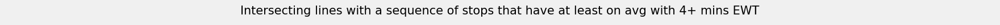

In [289]:
# plot interactive map

fig, ax = plt.subplots(1, 1, figsize = (20, 0.01))
ax.set_title('Intersecting lines with a sequence of stops that have at least on avg with 4+ mins EWT', size = 15)
ax.axis("off")
plt.show()

map_line_subset_ewt_3_mins_plus = fl.Map(
    location = [50.8476, 4.3572],
    tiles = 'CartoDB positron',
    zoom_start = 13,
    control_scale = True
)

for grp_name, df_grp in subset_lines.groupby('line'):
    
    feature_group = fl.FeatureGroup('Line ' + str(grp_name), show = True)
    
    for row in df_grp.itertuples():
        fl.Choropleth(
            geo_data = df_grp, 
            line_color = 'black',
            highlight = True
        ).add_to(feature_group)
        
    for index, data in subset_stops.loc[(subset_stops.line == grp_name)].iterrows():
        fl.Circle(
            location = [data.lat, data.lon], 
            tooltip = data[['vehicle', 'line', 'direction', 'stop_seq', 'stop_name', 'end_stop']].to_dict(), 
            radius = float(data.marker_weight), 
            color = data.colour_hex, 
            fill = True
        ).add_to(feature_group)
    
    feature_group.add_to(map_line_subset_ewt_3_mins_plus)
    
fl.LayerControl(collapsed = False).add_to(map_line_subset_ewt_3_mins_plus)
map_line_subset_ewt_3_mins_plus

In [ ]:
# close cursor connection to db

# cur.close()

## End.